In [2]:
#!/usr/bin/env python
%matplotlib inline  

import numpy as np
import matplotlib.pyplot as plt
import scipy.integrate as spi
import pandas as pd
import pyDOE
from scipy.stats import pearsonr,spearmanr,mannwhitneyu
from scipy.interpolate import interp1d

import resource
resource.setrlimit(resource.RLIMIT_NOFILE, (1000,-1))

rez=600



In [2]:
#whole Ab model
def Ab_model(t,Y1,Y2,k1,k2,h,IC50):
    Y_t = Y1*np.exp(-k1*t)+Y2*np.exp(-k2*t)
    I_t = 1/(1+(Y_t/IC50)**-h)
    return Y_t,I_t

#HIV dynamics model
def model(X,t,aS,dS,Bt0,tau,lam,dA,thL,xi,k,aE,dE,E50,w,p,g,Y1,Y2,k1,k2,h,IC50):
    
    dY = np.zeros(7);
    
    S=X[0]; AU=X[1]; AP=X[2]; LU=X[3]; LP=X[4]; E=X[5]; V=X[6];    
    
    Bt=Bt0*(1-1/(1+((Y1*np.exp(-k1*t)+Y2*np.exp(-k2*t))/IC50)**-h)) #compute Ab effect on infectivity
    
    dY[0] = aS - dS*S - Bt*S*V                         #susceptible cells
    dY[1] = (1-tau)*(1-lam)*Bt*S*V - dA*AU - k*E*AU + xi*LU    #active unproductively infected
    dY[2] = tau*(1-lam)*Bt*S*V - dA*AP - k*E*AP + xi*LP        #active productively infected
    dY[3] = (1-tau)*lam*Bt*S*V + thL*LU                #latent unproductively infected
    dY[4] = tau*lam*Bt*S*V + thL*LP                    #latent productively infected
    dY[5] = w*E*(AP+AU)/(E+E50) + aE - dE*E;           #adaptive immune system
    dY[6] = p*AP - g*V - Bt*S*V                        #virus
    return dY

#integrate the model and calculate a few extra variables of interest
def run_model(tt,X0,aS,dS,Bt0,tau,lam,dA,thL,xi,k,aE,dE,E50,w,p,g,Y1,Y2,k1,k2,h,IC50):
    
    infpoz,maxpoz,t_fp,t_max=0,0,0,0
    
    sol=spi.odeint(model, X0, tt, 
                   (aS,dS,Bt0,tau,lam,dA,thL,xi,k,aE,dE,E50,w,p,g,Y1,Y2,k1,k2,h,IC50),
                   mxstep=10000)    

    vll=np.log10(sol[:,6]/vol*1e3) #viral load as usual
    
    if (vll>-10).all() & (vll>2).any():        
        infpoz=np.where(vll>2)[0][0] #index of first positive
        maxpoz=np.where(vll==max(vll))[0][0]
        t_fp=tt[infpoz]
        t_max=tt[maxpoz]
    
    return sol,vll,infpoz,t_fp,t_max


## Testing the deterministic model

2.5359782608695656


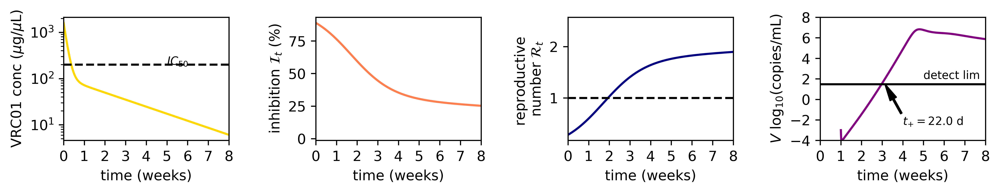

In [3]:
# parameters for viral dynamics model
vol = 1      # volume of blood [uL]
aS  = 70*vol;   #constant growth rate of susceptibles [cells/uL/day]
dS  = 0.3;   #susceptible death rate [1/day] 
Bt0 = 1e-4/vol  # infection rate of T-cells [uL/cells-day]/[uL]
dA  = 1.0       # active death rate [1/day]
p   = 5e4       # burst rate of virus from cells [virions/cell]
g   = 23        # virus clearance rate [1/day]
tau = 0.05      # productive infection probability []
lam = 1e-4      # latency probability []
thL = 5.2e-4    # latent clearance rate [1/day]
aL  = 0.015;    # latent proliferation rate [1/day] (Tcm)
xi  = 1e-5;     # latent activation rate [1/day]
dL  = aL-thL-xi # latent death rate
k   = 0.3/vol;  #immune cell killing rate [uL/cell-day]/[uL]
w   = 1.6;     #immune cell multiplier [1/day]
aE  = 1e-4*vol;   #initial E cell concentration [cells/uL]*[uL]
dE  = 0.002;  #immune death rate [1/day]
E50 = 250*vol;   #50 pct max E cell concentration [cells/uL]*[uL]

R0=aS*Bt0*tau*(1-lam)*p/g/dS/dA; print(R0) # basic reproductive number

#PK parameters
Y1,Y2,k1,k2 = 1500, 100, 1, 0.05 #low 30 or high 10 dose range

#PD parameters
IC50=200 # IC50 [ug/uL]
h=1  # hill coefficient []

V0=1e-6 #1 virion in body!

tY=np.linspace(0,7*8,1e3) #time for antibody dose
Y_t,I_t  = Ab_model(tY,Y1,Y2,k1,k2,h,IC50) #Ab model

tc=7 #first contact at 1 week

X0_det=np.array([aS/dS,0,0,0,0,aE/dE,V0])

in_tc=np.where(tY>tc)[0][0] #index of first contact

tV=tY[in_tc:] #time for virus so that we can start partway through window

sol,vll,infpoz,t_fp,t_max=run_model(tV,X0_det,aS,dS,Bt0,tau,lam,dA,thL,xi,k,aE,dE,E50,w,p,g,Y1,Y2,k1,k2,h,IC50) #first positive at 1 week

Rt=Bt0*tau*(1-lam)*(1-I_t)/dA*p/g*aS/dS #computing the reproductive number over time

fig,axarr=plt.subplots(1,4,figsize=(10,2),dpi=rez,sharex=True)

axarr[0].semilogy(tY/7,Y_t,color='gold')
axarr[0].set_ylabel('VRC01 conc ($\mu$g/$\mu$L)')
axarr[0].axhline(IC50,color='k',ls='--')
axarr[0].annotate('$IC_{50}$',xy=[5,IC50],fontsize=8)
axarr[0].set_xlim([0,8])
axarr[0].set_xticks(range(9))

axarr[1].plot(tY,I_t*100,color='coral') #allow burn in for some R0
axarr[1].set_ylabel(r'inhibition $\mathcal{I}_t$ (%)')

axarr[2].plot(tY,Rt,color='navy') #allow burn in for some R0
axarr[2].axhline(1,color='k',ls='--')
axarr[2].set_xticks(range(9))
axarr[2].set_ylabel('reproductive \n'+r'number $\mathcal{R}_t$')
#axarr[1].set_yticks(np.linspace(0,9,4))

#plot viral stuff
axarr[3].plot(tV/7,vll,color='purple') #virus/mL
#axarr[2][1].set_yticks(np.linspace(2,8,7))
axarr[3].axhline(np.log10(30),color='k')
axarr[3].annotate('detect lim',xy=[5,2],fontsize=8)
if t_fp>0:
    axarr[3].annotate('$t_{+}=$'+str(round(t_fp,1))+' d',fontsize=8,xy=(t_fp/7, np.log10(30)), 
                  xytext=(4, -2.5),arrowprops=dict(color='black',width=1, headwidth=5,shrink=10))
axarr[3].set_ylabel('$V$ $\log_{10}$(copies/mL)')
axarr[3].set_yticks(range(-4,9,2))
axarr[3].set_ylim([-4,8])

for i in range(4):
    axarr[i].set_xlabel('time (weeks)')


plt.tight_layout()
plt.savefig('figures/det_model_withAb1.pdf')


In [4]:
t_fp

21.973973973973973

In [1]:
#the functions to model the same process stochastically with the hybrid stochastic model

#updating the rates of events
num_rates=21; num_states=7; rl=np.zeros(num_rates); T=np.zeros([num_states,num_rates])

def update_rates(X,ti,vol,aS,dS,Bt0,tau,lam,dI,thL,xi,k,aE,dE,E50,w,p,g,Y1,Y2,k1,k2,h,IC50):
        
    S,AU,AP,LU,LP,E,V=X; #easier to read if variables actually spelled out
    
    Bt=Bt0*(1-1/(1+((Y1*np.exp(-k1*t)+Y2*np.exp(-k2*t))/IC50)**-h)) #compute Ab effect on infectivity
                
    pr=np.random.poisson(p)    #kp=0.1; pr=np.random.gamma(kp,p)

    rl[0] = aS;                     T[:,0] =[1,0,0,0,0,0,0];  #constant production 
    rl[1] = dS*S;                   T[:,1] =[-1,0,0,0,0,0,0]  #density dependent susceptible death
    rl[2] = (1-tau)*(1-lam)*Bt*S*V; T[:,2] =[-1,1,0,0,0,0,-1] #unproductive active infection
    rl[3] = tau*(1-lam)*Bt*S*V;     T[:,3] =[-1,0,1,0,0,0,-1] #productive active infection
    rl[4] = (1-tau)*lam*Bt*S*V;     T[:,4] =[-1,0,0,1,0,0,-1] #unproductive latent infection
    rl[5] = tau*lam*Bt*S*V;         T[:,5] =[-1,0,0,0,1,0,-1] #productive latent infection
    rl[6] = dA*AU;                  T[:,6] =[0,-1,0,0,0,0,0]  #unproductive active death
    rl[7] = dA*AP;                  T[:,7] =[0,0,-1,0,0,0,pr]  #productive active death and virus burst
    rl[8] = dL*LU;                  T[:,8] =[0,0,0,-1,0,0,0]  #unproductive latent death
    rl[9] = dL*LP;                  T[:,9] =[0,0,0,0,-1,0,0]  #productive latent death
    rl[10] = aL*LU;                 T[:,10]=[0,0,0,1,0,0,0]  #unproductive latent proliferation
    rl[11] = aL*LP;                 T[:,11]=[0,0,0,0,1,0,0]  #productive latent proliferation
    rl[12] = xi*LU;                 T[:,12]=[0,1,0,-1,0,0,0]  #unproductive latent activation
    rl[13] = xi*LP;                 T[:,13]=[0,0,1,0,-1,0,0]  #productive latent activation
    rl[14] = k*E*AU;                T[:,14]=[0,-1,0,0,0,0,0]  #unproductive active immune removal
    rl[15] = k*E*AP;                T[:,15]=[0,0,-1,0,0,0,0]  #productive active immune removal
    rl[16] = w*E*(AP+AU)/(E+E50);   T[:,16]=[0,0,0,0,0,1,0]  #immune cell recruitment
    rl[17] = aE;                    T[:,17]=[0,0,0,0,0,1,0]  #immune cell birth
    rl[18] = dE*E;                  T[:,18]=[0,0,0,0,0,-1,0]  #immune cell clearance
    rl[19] = g*V;                   T[:,19]=[0,0,0,0,0,0,-1]  #innate viral clearance
    
    return rl,T

num_det=2;
num_sto=20-num_det;

#function that solves stochastically using hybrid update
def run_hybrid(t,inc_time,aS,dS,Bt0,tau,lam,dI,thL,xi,k,aE,dE,E50,w,p,g,Y1,Y2,k1,k2,h,IC50):
    
    vol = 1e6      # volume of blood [uL]

    #few extra conversions for volume
    aS  = aS*vol;   #constant growth rate of susceptibles [cells/uL/day]
    Bt  = Bt0/vol*(1-I_t) #Ab dependent infectivity including volumne
    k   = k/vol;  #immune cell killing rate [uL/cell-day]/[uL]
    aE  = aE*vol;   #initial E cell concentration [cells/uL]*[uL]
    E50 = E50*vol;   #50 pct max E cell concentration [cells/uL]*[uL]

    X0=np.array([aS/dS,0,0,0,0,aE/dE,0]) #always true because virus gets added at inc_time

    t_sto=np.random.exponential(1,[num_sto]); #exponential random time event variables with magnitude 1 
    g_j=np.zeros([1,num_sto]); #rate integral dg/dt = r
    dt=t[1]; x=X0*vol; y=[] #initialize

    inf_flag=0 #flag to add the infected cell at inc_time
    
    for ti in t:
        
        y.append(x) #the list of states
        
        #first step
        rl,T = update_rates(x,ti,vol,aS,dS,Bt0,tau,lam,dI,thL,xi,k,aE,dE,E50,w,p,g,Y1,Y2,k1,k2,h,IC50) #make new rate vector
        k1X=np.sum(rl[:num_det]*T[:,:num_det],1)*dt;
        k1g=rl[num_det+1:]*dt;

        #2nd step
        temp_x=x+0.5*k1X 
        rl,T = update_rates(temp_x,ti,vol,aS,dS,Bt0,tau,lam,dI,thL,xi,k,aE,dE,E50,w,p,g,Y1,Y2,k1,k2,h,IC50) #make new rate vector
        k2X=np.sum(rl[:num_det]*T[:,:num_det],1)*dt;
        k2g=rl[num_det+1:]*dt;
 
        #3rd step
        temp_x=x+0.5*k2X 
        rl,T = update_rates(temp_x,ti,vol,aS,dS,Bt0,tau,lam,dI,thL,xi,k,aE,dE,E50,w,p,g,Y1,Y2,k1,k2,h,IC50) #make new rate vector
        k3X=np.sum(rl[:num_det]*T[:,:num_det],1)*dt;
        k3g=rl[num_det+1:]*dt;

        #4th step
        temp_x=x+k3X 
        rl,T = update_rates(temp_x,ti,vol,aS,dS,Bt0,tau,lam,dI,thL,xi,k,aE,dE,E50,w,p,g,Y1,Y2,k1,k2,h,IC50) #make new rate vector
        k4X=np.sum(rl[:num_det]*T[:,:num_det],1)*dt;
        k4g=rl[num_det+1:]*dt;
   
        x = x + (k1X + 2*k2X + 2*k3X + k4X)/6; #RK4 update
        g_j = g_j + (k1g + 2*k2g + 2*k3g + k4g)/6; #RK4 update
    
        sto = g_j > t_sto; #see if any stochastic transitions occured
    
        for i in range(len(sto[0])):
            x = x + int(sto[0][i])*T[:,i+num_det] #update the state vector with stochastic transition
            t_sto[i] = t_sto[i] + int(sto[0][i])*np.random.exponential(1); #update the stochastic time vector
     
        x[x<1]=0 #make sure no negative numbers or fractions
        
        #add a single infected cell
        if ti>=inc_time and inf_flag==0:
            x[6] = x[6] + 1 #add 1 virion at the contact time
            inf_flag=1
            
                
    return np.array(y)

NameError: name 'np' is not defined

## Testing the stochastic model

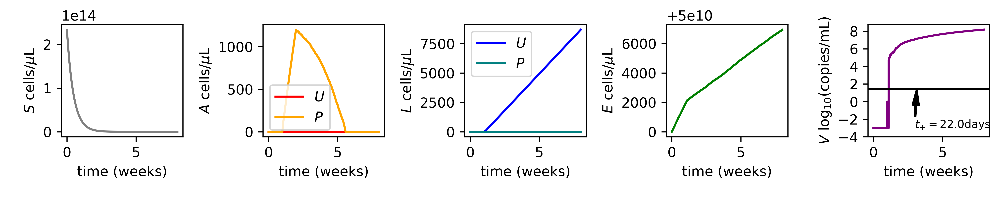

In [6]:
t=np.linspace(0,7*8,1e4) #time for antibody dose
sol_sto=run_hybrid(t,tc,aS,dS,Bt0,tau,lam,dA,thL,xi,k,aE,dE,E50,w,p,g,0,Y2,k1,k2,h,IC50)

sol=sol_sto

vll=np.log10(sol[:,6]+0.001)

fig,axarr=plt.subplots(1,5,figsize=(10,2),dpi=rez,sharex=True)

axarr[0].plot(t/7,sol[:,0],'gray')
axarr[0].set_ylabel('$S$ cells/$\mu$L')
axarr[0].set_xticks(range(0,26,5))
#axarr[0].set_xlim([0,8])

axarr[1].plot(t/7,sol[:,1],'red')
axarr[1].plot(t/7,sol[:,2],'orange')
axarr[1].set_ylabel('$A$ cells/$\mu$L')
axarr[1].legend(['$U$','$P$'])

axarr[2].plot(t/7,sol[:,3],'blue')
axarr[2].plot(t/7,sol[:,4],'teal')
axarr[2].set_ylabel('$L$ cells/$\mu$L')
axarr[2].legend(['$U$','$P$'])

axarr[3].plot(t/7,sol[:,5],'green')
axarr[3].set_ylabel('$E$ cells/$\mu$L')

axarr[4].plot(t/7,vll,'purple')
axarr[4].axhline(np.log10(30),color='k')
#axarr[4].axvline(t_fp/7,ls='--',color='k',lw=0.5)
axarr[4].annotate('detect lim',xy=[10,0],fontsize=8)
axarr[4].annotate('$t_{+}=$'+str(round(t_fp,1))+'days',fontsize=8,xy=(t_fp/7, np.log10(30)), 
                  xytext=(3, -3),arrowprops=dict(color='black',width=1, headwidth=5,shrink=10))
axarr[4].set_ylabel('$V$ $\log_{10}$(copies/mL)')
axarr[4].set_yticks(range(-4,9,2))
    
for i in range(5):
    axarr[i].set_xlabel('time (weeks)')
        
plt.tight_layout()
plt.savefig('figures/hybrid_model.pdf')


In [166]:
#import the best Robb fit params from before
gf=pd.read_csv('goodP_list.csv')
goodP_list=gf.iloc[:,1:].values.tolist()

pnames=[r'$\alpha_S$',r'$\delta_S$',r'$\beta_0$',r'$\tau$',r'$\lambda$',
        r'$\delta_I$',r'$\theta_L$',r'$\xi$',r'$\kappa$',r'$\alpha_E$',
        r'$\delta_E$',r'$E_{50}$',r'$\omega$',r'$\pi$',r'$\gamma$']

#variables to check sensitivity
variables = ['first contact time ' + r'$t_c$',
             'bnAb conc 1 ' + r'$\mathcal{Y}_1$', 
             'bnAb conc 2 ' + r'$\mathcal{Y}_2$',
             'decay rate 1 ' + r'$k_1$',
             'decay rate 2 ' + r'$k_2$',
             'Hill coefficient ' + r'$h$',
             '50% effectiveness ' + r'$IC_{50}$']

#variable rangez for each cohort
rangez10=np.array([[0, 56], [460.18157580773487, 1523.660410055955], [21.257346915715821, 303.33958994404503], [0.42098209564375422, 34.029494753684688], [0.026143650755233082, 0.075659210797802939], [0.48351545422319281, 1.8162354175187263], [-2, 2]])
#rangez10=np.array([[0, 56], [460.18157580773487, 1523.660410055955], [21.257346915715821, 303.33958994404503], [0.42098209564375422, 34.029494753684688], [0.026143650755233082, 0.075659210797802939], [0.48351545422319281, 1.8162354175187263], [0.031, 12.300000000000001]])
rangez30=np.array([[0, 56], [1417.0687536924652, 2483.4504368552621], [57.860088706565897, 436.93124630753533], [0.90406007929783117, 16.768852709514881], [0.02015311688945523, 0.08171220506458414], [0.48351545422319281, 1.8162354175187263], [0.031, 12.300000000000001]])

trial='10'
all_vals=rangez10 #put param sets together
#all_vals=np.append(rangez10,rangez30,1) #put param sets together


In [167]:
################################################################################
#global sensitivity analysis function

sampz=10**4 #number of LHS samples

lhs_samples = pyDOE.lhs( int(len(variables)), samples=sampz, criterion='center') #create the samples in [0,1]

tt=np.linspace(0,56,1e4) #8 week time series in days

var_vals=np.zeros(len(variables)); var_vals_list=np.zeros([len(variables),sampz])

outcome_list=[]; good_sets=[]

if sampz<50:
    fig, ax = plt.subplots(1,2,figsize=(4,3),dpi=rez,sharex=True)

rangez=np.zeros([len(variables),2])
for i in range(len(variables)):
    rangez[i,:]=all_vals[i].min(),all_vals[i].max() #arrange small to big
    
ppt_list=[]
#looping over the number of LHS samples
for i in range(sampz):

    #make the variable values using the LHS sampling
    var_vals = rangez[:,0]+lhs_samples[i,:]*(rangez[:,1]-rangez[:,0])
    #var_vals    = 10**(np.log10(rangez[0][0]) + lhs_samples[i][0]*(np.log10(rangez[0][1])-np.log10(rangez[0][0])))
    
    var_vals_list[:,i]=var_vals #append to all the variables
    
    rand_ppt=np.random.randint(0,len(goodP_list)) #choose a random participant ID
    
    ppt_list.append(rand_ppt)
    
    aSr,dSr,Bt0r,taur,lamr,dAr,thLr,xir,kr,aEr,dEr,E50r,wr,pr,gr=goodP_list[rand_ppt] #choose a random model
    t_expose,Y1,Y2,k1,k2,h,IC50=var_vals #choose LHS range of params

    in_tc=np.where(tY>t_expose)[0][0] #index of first contact
    tV=tY[in_tc:] #time for virus
    sol,vll,infpoz,time_first_pos,t_max=run_model(
        tV,X0_det,aSr,dSr,Bt0r,taur,lamr,dAr,thLr,xir,kr,aEr,dEr,E50r,wr,pr,gr,Y1,Y2,k1,k2,h,10**IC50)

    #calculate outcomes
    dt=tY[1]
    time_to_peak=t_max-tV[0]; #time_to_peak=time_to_peak[time_to_peak>0] #days make sure this only counts good ones
    
    max_VL=np.min([10,np.nanmax(vll)]) #copies/mL, ignore weird artificially high ones
    AUC_VL=np.nansum(vll*dt) #copies/mL
    AUC_E=sol[-1,5] #cells/uL, final number, sort of total recruited
    Ltot=(sol[-1,3]+sol[-1,4])/sol[-1,0]*1e6 #IUPM at end of 8 weeks
    
    BT=0
    if (vll>np.log10(30)).any():
        BT=1
        
    outcome_list.append([time_first_pos, time_to_peak, max_VL, AUC_VL, AUC_E, Ltot, BT])
        
    if sampz<50:
        #make plots showing variation              
        ax[0].plot(tV/7,vll,alpha=0.3)

        Y_t,I_t = Ab_model(tt,Y1,Y2,k1,k2,h,10**IC50)    #refreshes every 8 weeks
        ax[1].plot(tt/7, R0*(1-I_t),alpha=0.3)

if sampz<50:
    ax[0].set_ylim([-8,8])
    ax[0].set_ylabel('VL $\log_{10}$(copies/mL)')
    ax[0].set_xlabel('time (weeks)')
    ax[0].axhline(np.log10(30),color='k')
    ax[0].annotate('detect lim',xy=[1,2],fontsize=8)
    ax[1].set_ylabel('$\mathcal{R}(Ab,t)$')
    ax[1].set_xlabel('time (weeks)')
    #ax[0].set_xticks(np.linspace(0,8,9))
    ax[1].axhline(1,color='k',ls='--')
    #plt.ylim([-5,10])
    plt.tight_layout()
    #plt.legend(range(sampz),fontsize=6)
    plt.savefig('figures/'+trial+'global_sensistivity_examples.pdf')
    

/Applications/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:34: RuntimeWarning: invalid value encountered in log10
/Applications/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:36: RuntimeWarning: invalid value encountered in greater
/Applications/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:53: RuntimeWarning: invalid value encountered in greater
/Applications/anaconda/lib/python3.6/site-packages/scipy/integrate/odepack.py:218: ODEintWarning: Excess work done on this call (perhaps wrong Dfun type). Run with full_output = 1 to get quantitative information.
  warnings.warn(warning_msg, ODEintWarning)
/Applications/anaconda/lib/python3.6/site-packages/scipy/integrate/odepack.py:218: ODEintWarning: Repeated convergence failures (perhaps bad Jacobian or tolerances). Run with full_output = 1 to get quantitative information.
  warnings.warn(warning_msg, ODEintWarning)
/Applications/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:34: RuntimeWar

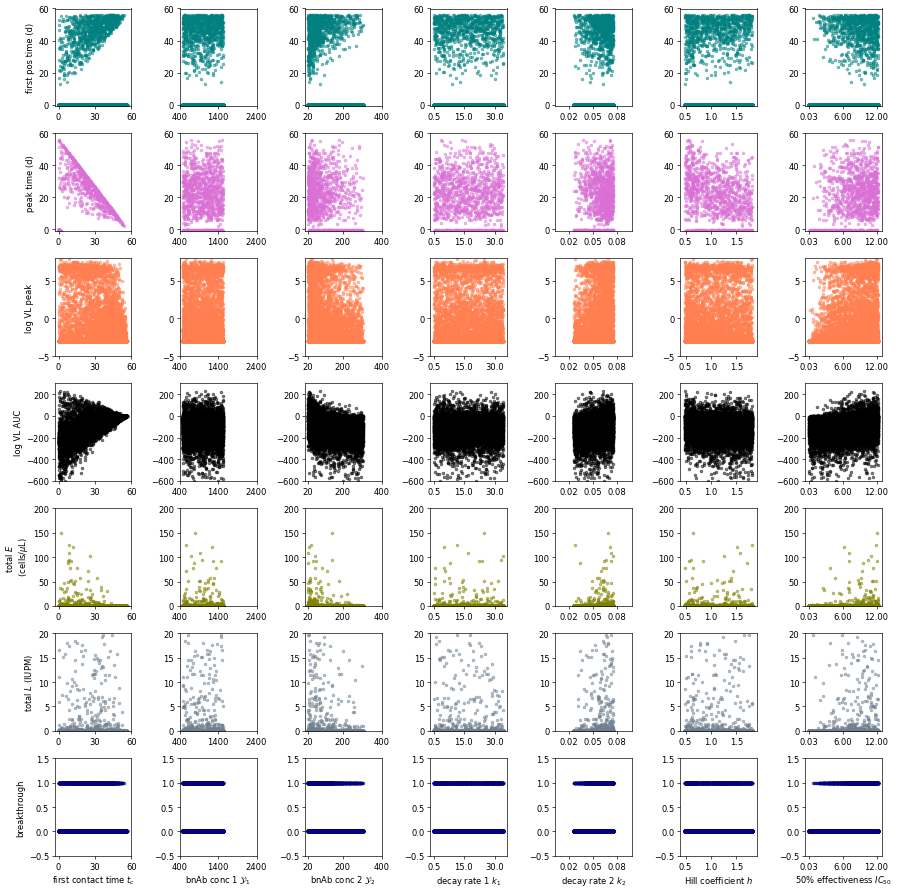

In [9]:
outcomes=np.array(outcome_list) #change it to array

corrz=np.zeros([len(variables),len(outcomes[0,:])])
pvalz=np.zeros([len(variables),len(outcomes[0,:])])

rez2=60

fig,axarr = plt.subplots(len(outcomes[0,:]),len(variables),figsize=(15,15),dpi=rez2)

outcome_names=['first pos time (d)','peak time (d)','log VL peak','log VL AUC','total $E$ \n (cells/$\mu$L)','total $L$ (IUPM)','breakthrough']
cz=['teal','orchid','coral','black','olive','slategray','navy']

xtickz=[[0,30,60],[400,1400,2400],[20,200,400],[0.5,15,30],[0.02,0.05,0.08],[0.5,1,1.5],[0.03,6,12],[0,1]] #xtick labels
ylimz=[[-1,60],[-1,60],[-5,8],[-600,300],[0,200],[0,20],[-0.5,1.5]] #yaxis limits
#for i in range(len(outcome_list)):
for i in range(len(variables)):

    for j in range(len(outcomes[0,:])):
        #compute correlations (ranked via spearman)
        corrz[i,j]=spearmanr(var_vals_list[i,:],outcomes[:,j])[0]
        pvalz[i,j]=spearmanr(var_vals_list[i,:],outcomes[:,j])[1]

        ax=axarr[j][i]
        #ax.scatter(var_vals_list[i,:]/np.mean(rangez,1)[i],outcomes[:,j],s=10,alpha=0.5,color=cz[j])
        ax.scatter(var_vals_list[i,:],outcomes[:,j],s=10,alpha=0.5,color=cz[j])
        ax.set_xticks(xtickz[i])
        ax.set_ylim(ylimz[j])
        #ax.set_xticks(np.linspace(rangez[i,0],rangez[i,1],3))
        #if j>2:
            #ax.set_yscale('log')
        axarr[j][0].set_ylabel(outcome_names[j],fontsize=10)
    
    axarr[len(outcome_names)-1][i].set_xlabel(variables[i],fontsize=10)

plt.tight_layout()
plt.savefig('figures/'+trial+'sensitivity_global_scatters.pdf')


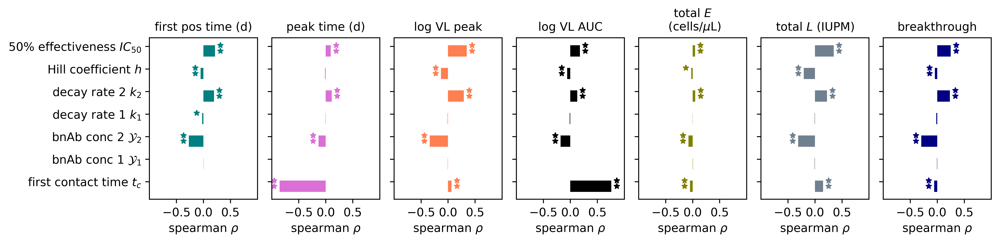

In [10]:
#correlation coefficient bar plots
fig,axarr=plt.subplots(1,len(outcome_names),figsize=(12,3),sharey=True,sharex=True,dpi=rez)
bspace=np.arange(0,len(variables)*2,2)

#sort the variable names for y axis labels
#indz=cum_corrs[:,0].argsort()
#sorted_vars=[]
#for kk in range(len(variables)):
#    sorted_vars.append(variables[indz[kk]])

for j in range(len(outcome_names)):
    ax=axarr[j]
    ax.barh(bspace,corrz[:,j],1,color=cz[j])
    
    #plot significance
    for i in range(len(variables)):
        if pvalz[i,j]<0.05:
            ax.scatter(corrz[i,j]+np.sign(corrz[i,j])*0.1,bspace[i]+0.5,color=cz[j],marker='*',s=20)
        if pvalz[i,j]<0.01:
            ax.scatter(corrz[i,j]+np.sign(corrz[i,j])*0.1,bspace[i],color=cz[j],marker='*',s=20)
    
    ax.set_title(outcome_names[j],fontsize=10)
    ax.set_xlabel('spearman '+ r'$\rho$',fontsize=10)
    #ax.axvline(-1.1,color='k',lw=0.8)
        
ax.set_xlim([-1,1])
ax.set_xticks([-0.5,0,0.5])

plt.yticks(bspace+0.4,variables,fontsize=8)
fig.tight_layout()


fig.savefig('figures/'+trial+'sensitivity_correlation_bars.pdf')
    


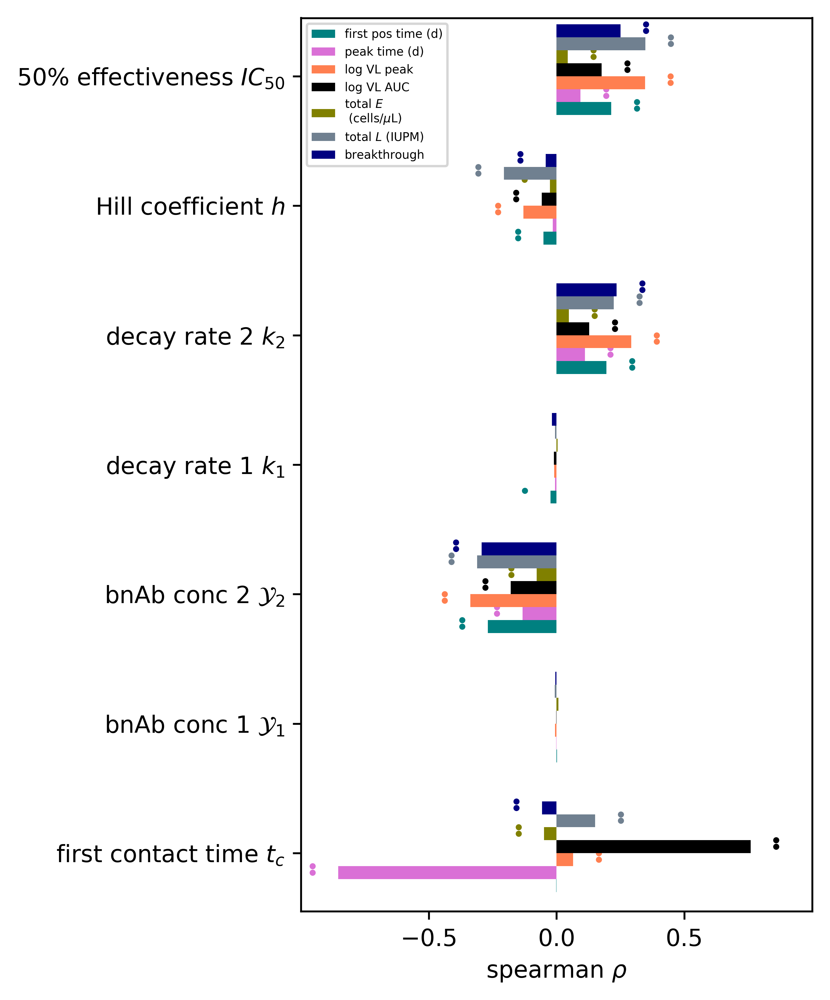

In [11]:
#correlation coefficient bar plots
plt.figure(figsize=(5,6),dpi=rez)
bspace=np.arange(0,len(variables)*2,2)

bw=0.2 #barwidth
leg_list=[]
for j in range(len(outcome_names)):

    leg=plt.barh(bspace+j*bw,corrz[:,j],bw,color=cz[j])
    if j<len(outcome_names):
        leg_list.append(leg)
    
    #plot significance
    for i in range(len(variables)):
        if pvalz[i,j]<0.05:
            plt.scatter(corrz[i,j]+np.sign(corrz[i,j])*0.1,bspace[i]+j*bw+0.1,color=cz[j],marker='.',s=10)
        if pvalz[i,j]<0.01:
            plt.scatter(corrz[i,j]+np.sign(corrz[i,j])*0.1,bspace[i]+j*bw,color=cz[j],marker='.',s=10)
    
plt.xlabel('spearman '+ r'$\rho$',fontsize=10)
plt.xlim([-1,1])
plt.ylim([-0.4,13.4])
plt.xticks([-0.5,0,0.5])

plt.yticks(bspace+0.5,variables,fontsize=10)
plt.tight_layout()
plt.legend(leg_list,outcome_names,fontsize=5,loc=2)

plt.savefig('figures/'+trial+'sensitivity_correlation_bars_ALL.pdf')
    


In [12]:
#initialize variables
IC50_first=np.zeros(sampz)
Y_first=np.zeros(sampz)
R_first=np.zeros(sampz)
AUClist=np.zeros(sampz)

#compute the variables of interest
for i in range(sampz):
    tc,Y1,Y2,k1,k2,h,IC50=var_vals_list[:,i]
    
    IC50_first[i]=IC50
    Y_first[i],I_first = Ab_model(tc,Y1,Y2,k1,k2,h,IC50)    #Ab level at first contact
    aSr,dSr,Bt0r,taur,lamr,dAr,thLr,xir,kr,aEr,dEr,E50r,wr,pr,gr=goodP_list[ppt_list[i]]

    R_first[i]=Bt0r*taur*(1-lamr)*(1-I_first)/dAr*pr/gr*aSr/dSr #computing the reproductive number over time
    
    Y_t,I_t = Ab_model(tt,Y1,Y2,k1,k2,h,IC50)    #Ab level at first contact
    AUClist[i]=np.log10(np.sum(Y_t*tt[1]))



In [13]:
outcome_names

['first pos time (d)',
 'peak time (d)',
 'log VL peak',
 'log VL AUC',
 'total $E$ \n (cells/$\\mu$L)',
 'total $L$ (IUPM)',
 'breakthrough']

In [14]:
saveable_outcome_names=['firstpos','peaktime','peakVL','VLAUC','adaptive','latent','breakthrough']

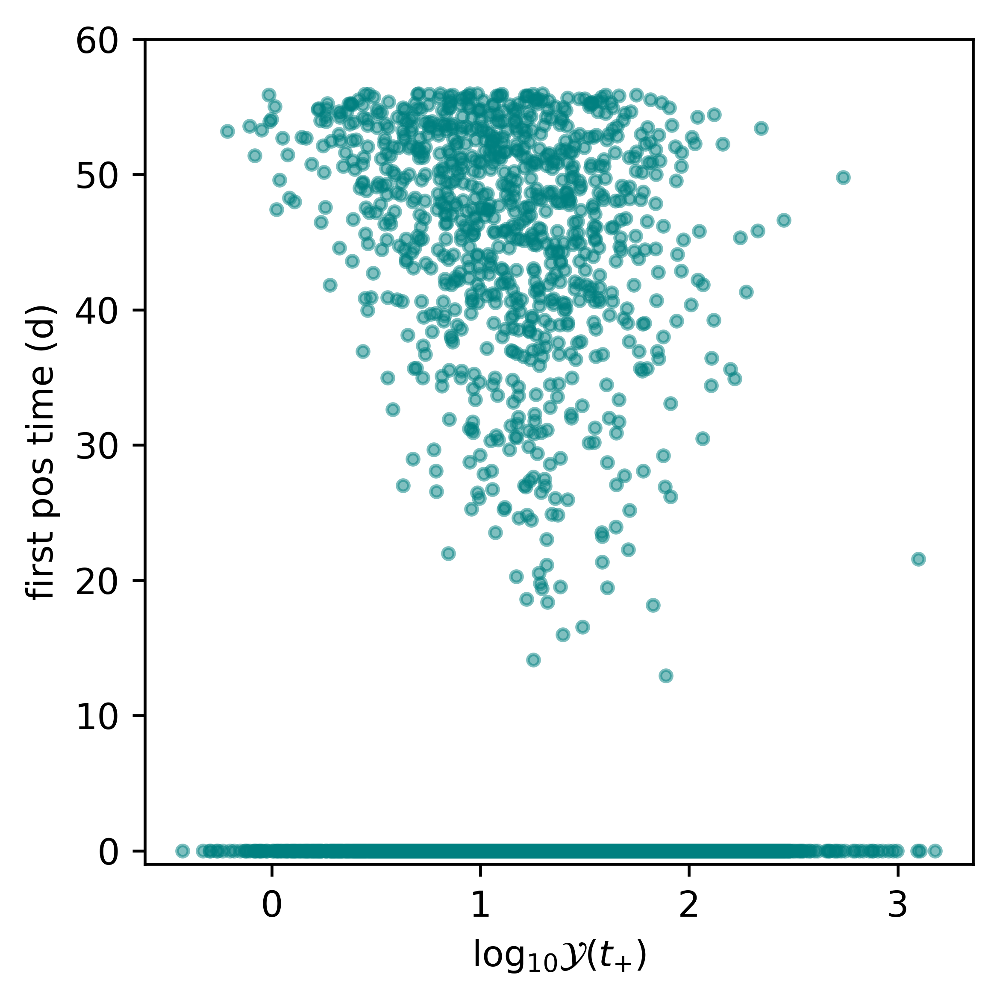

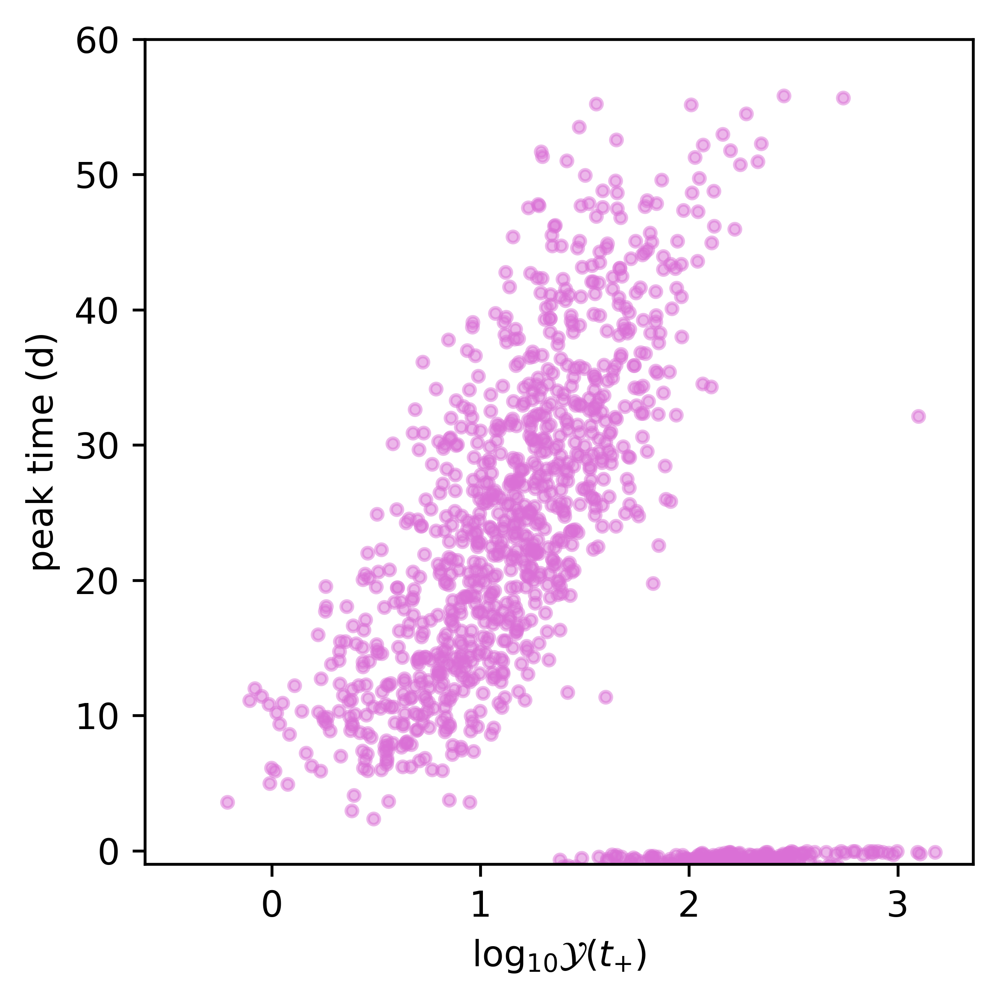

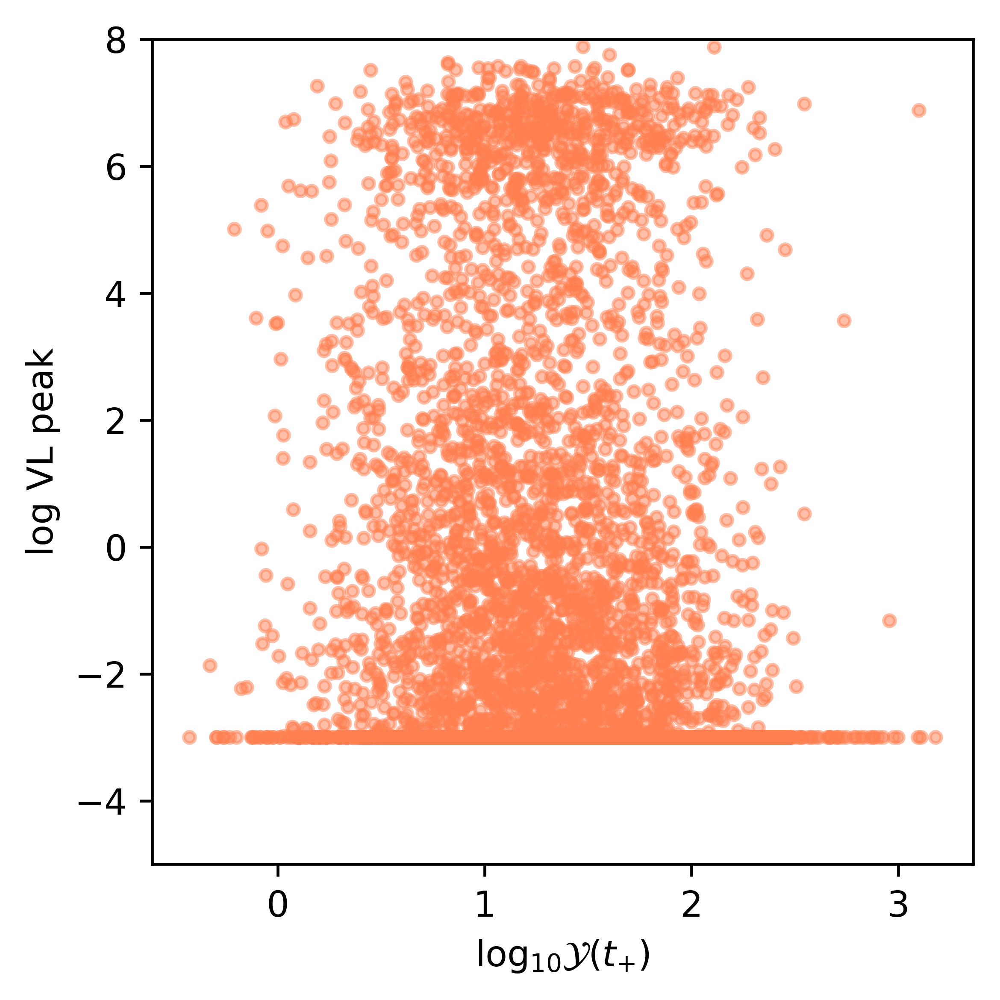

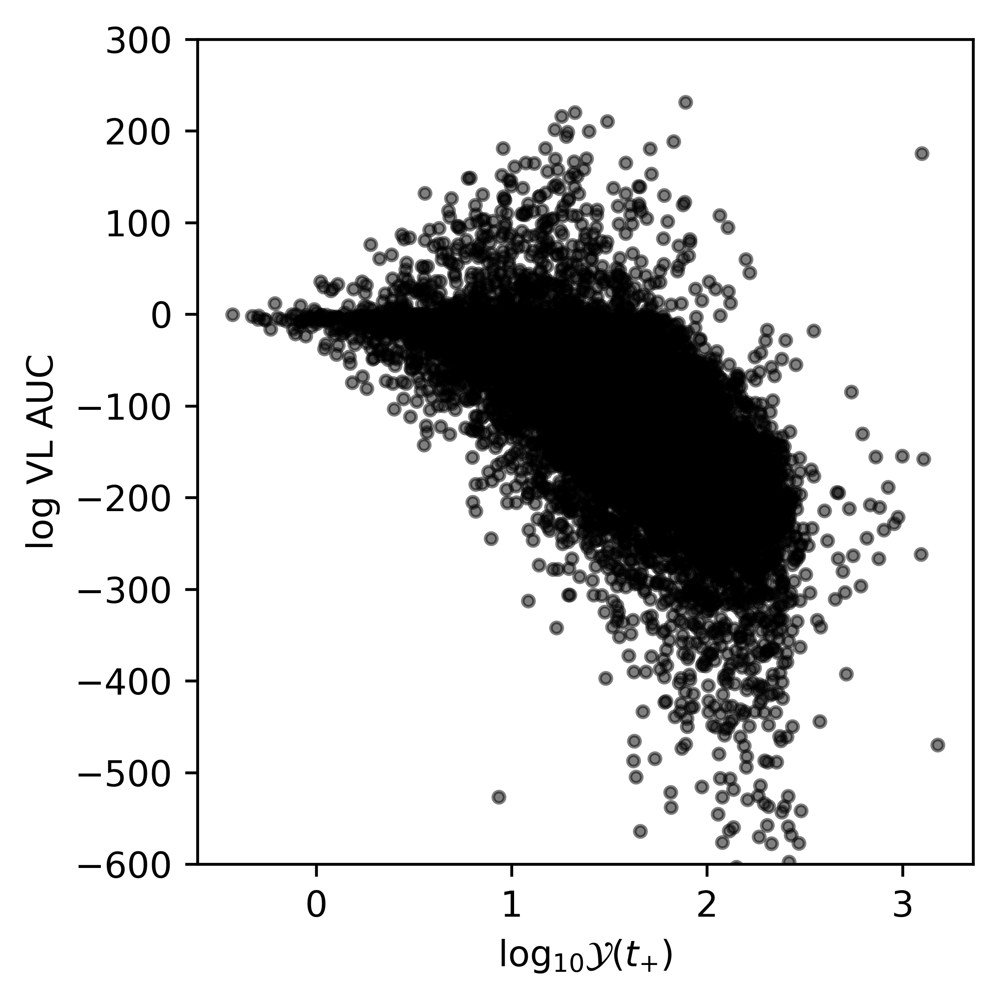

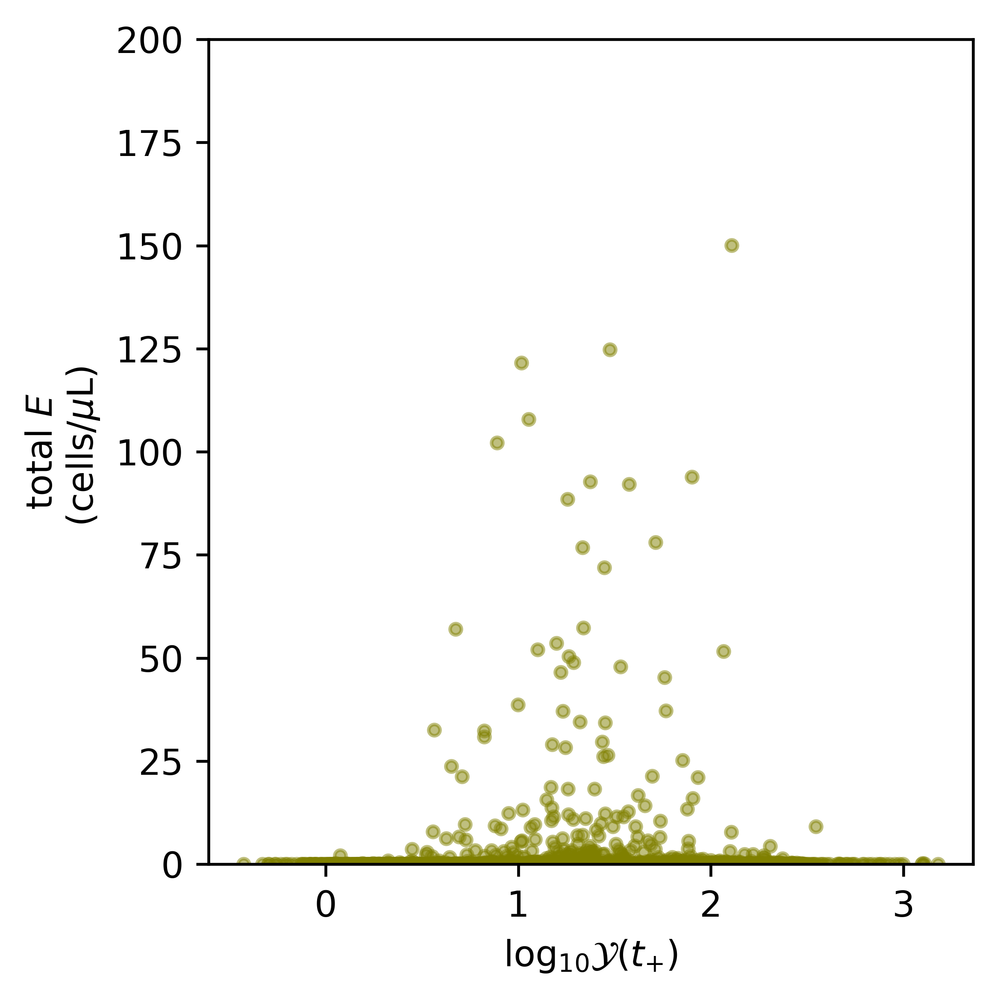

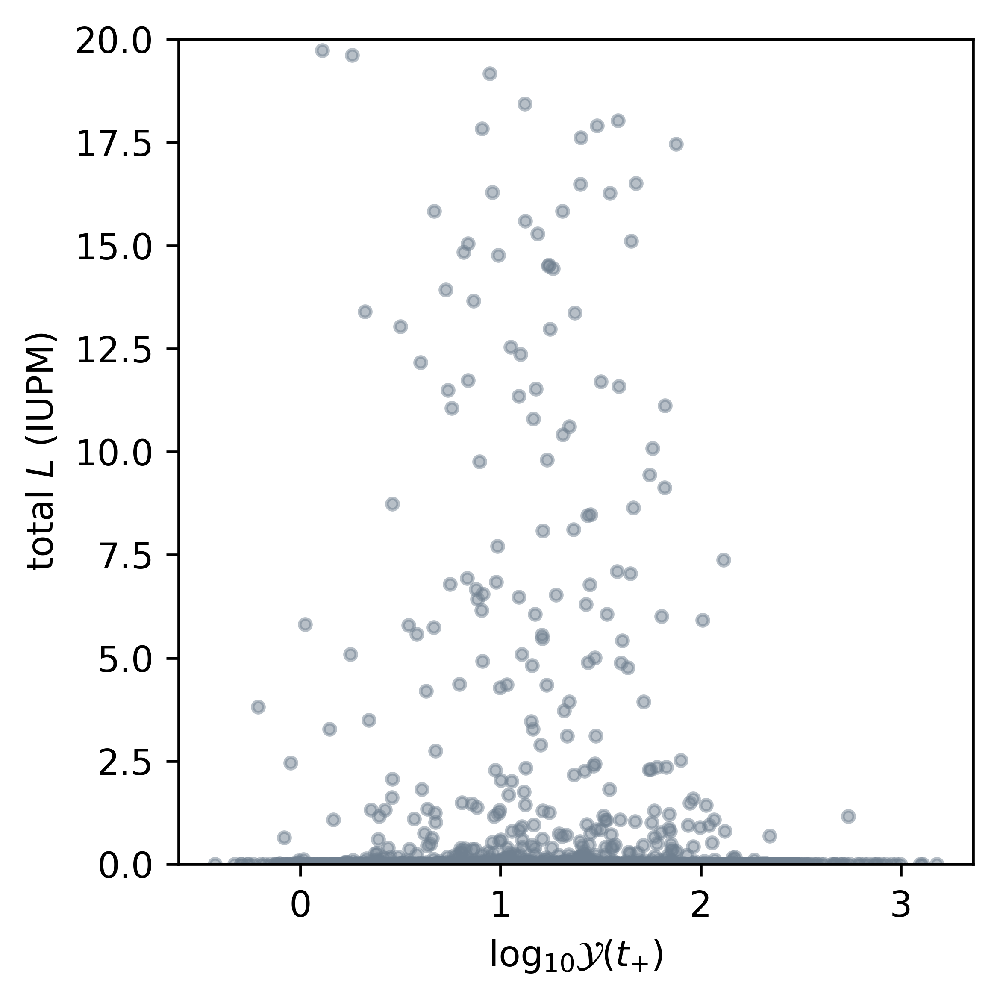

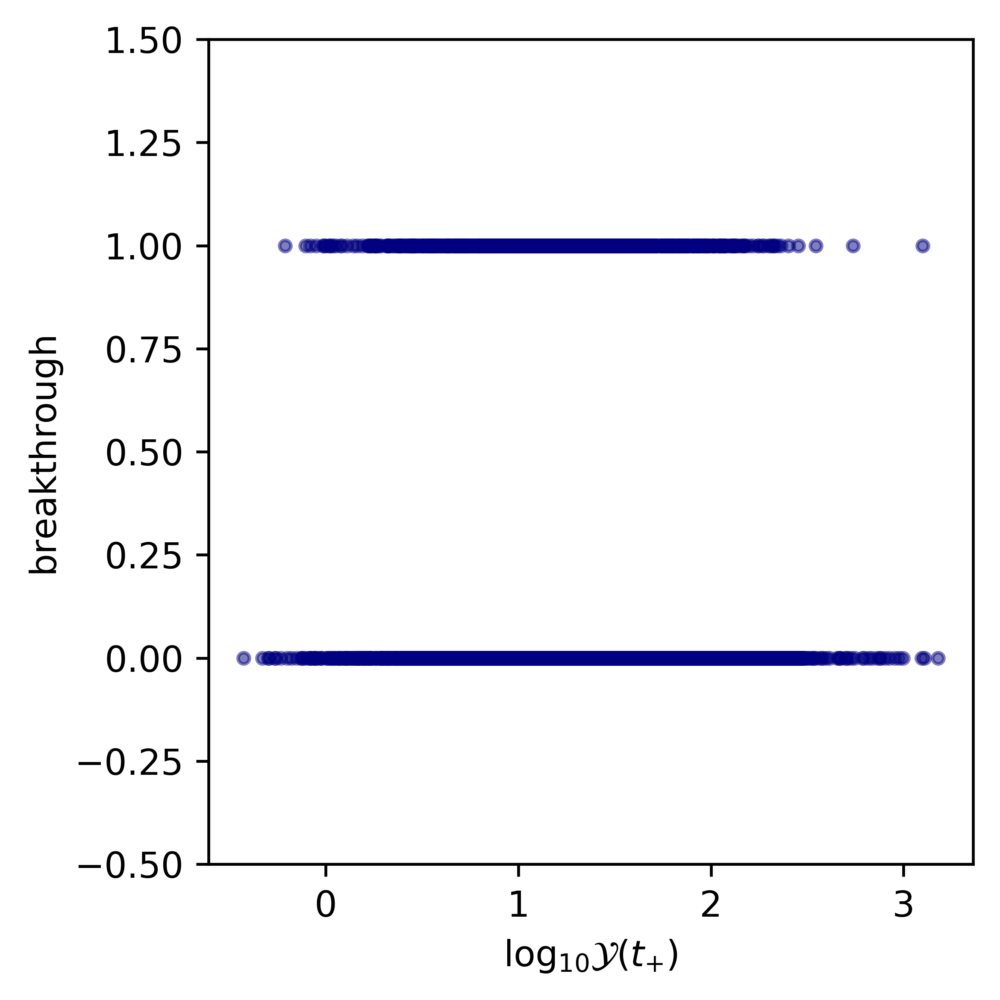

In [15]:
#plot correlation between Ab level at first contact against outcomes
for j in range(len(outcome_names)):
    plt.figure(figsize=(4,4),dpi=rez)
    plt.scatter(np.log10(Y_first),outcomes[:,j],s=10,alpha=0.5,color=cz[j])
    plt.ylabel(outcome_names[j],fontsize=10)
    plt.ylim(ylimz[j])
    plt.xlabel('$\log_{10}\mathcal{Y}(t_{+})$')
    plt.tight_layout()
    plt.savefig('figures/'+trial+'sensitivity_Yfirst_'+saveable_outcome_names[j]+'.pdf')



MannwhitneyuResult(statistic=3085301.0, pvalue=6.6628183368631001e-113)

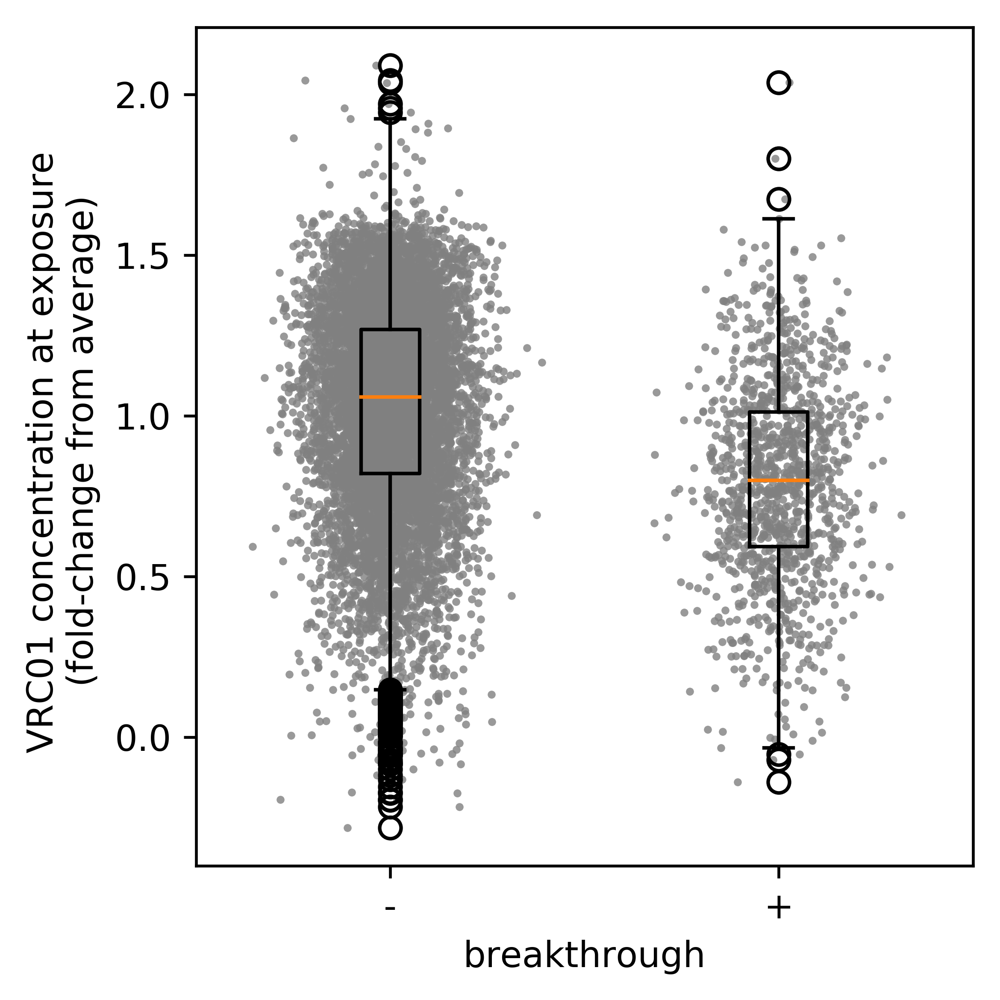

In [36]:
#just do breakthrough comparisons
plt.figure(figsize=(4,4),dpi=rez)

BT=outcomes[:,-1]
#var=np.log10(Y_first)
var=np.log10(Y_first)/np.mean(np.log10(Y_first))

plt.scatter(BT+np.random.normal(1,0.1,len(BT)),var,s=5,alpha=0.8,color='gray',lw=0)

plt.boxplot([var[BT<1],var[BT>0]])#,s=5,alpha=0.1,color=cz[j])

plt.xlabel('breakthrough',fontsize=10)
plt.xlim([0.5,2.5])
plt.xticks([1,2],['-','+'])
plt.ylabel('VRC01 concentration at exposure \n (fold-change from average)')
plt.tight_layout()
plt.savefig('figures/'+trial+'sensitivity_YvsBT.pdf')

mannwhitneyu(var[BT<1],var[BT>0])

MannwhitneyuResult(statistic=2856723.0, pvalue=2.3753312956625275e-138)

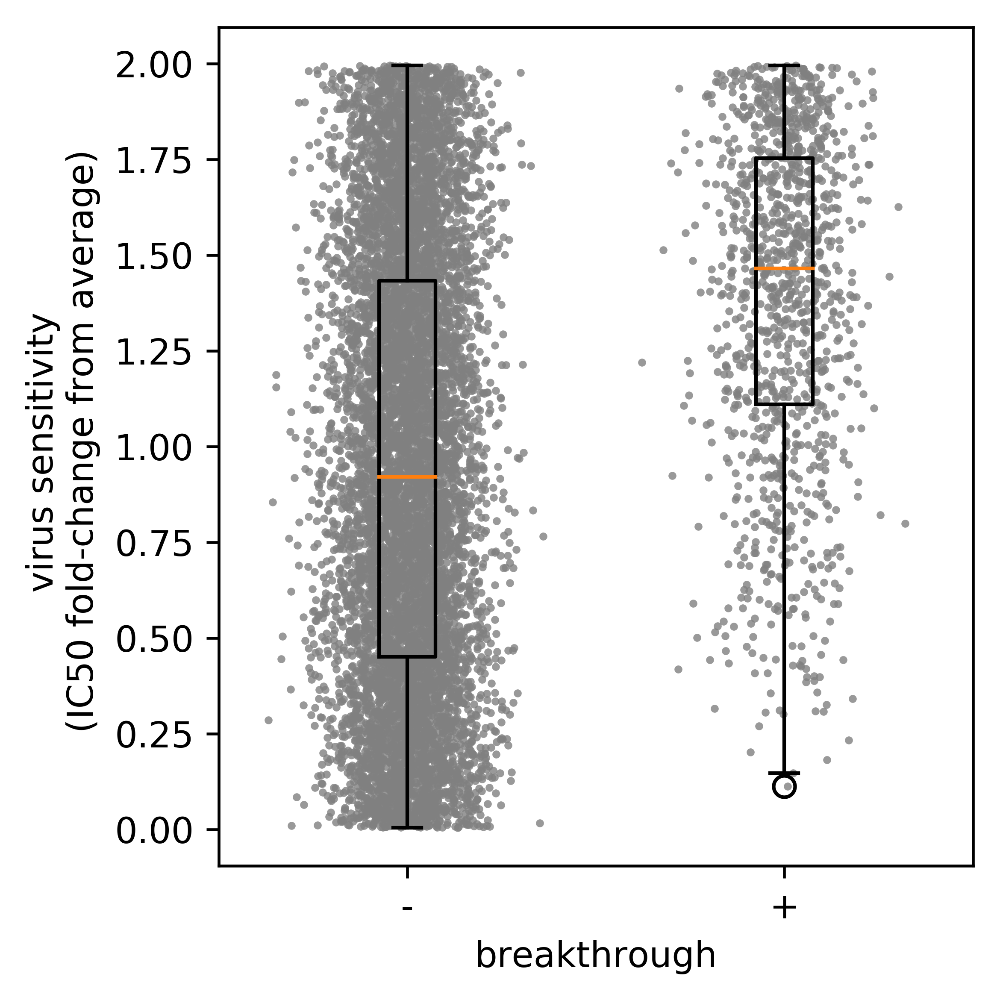

In [37]:
#just do breakthrough comparisons
plt.figure(figsize=(4,4),dpi=rez)

BT=outcomes[:,-1]

var=IC50_first/np.mean(IC50_first)
#var=np.log10(IC50_first)

plt.scatter(BT+np.random.normal(1,0.1,len(BT)),var,s=5,alpha=0.8,color='gray',lw=0)

plt.boxplot([var[BT<1],var[BT>0]])#,s=5,alpha=0.1,color=cz[j])

plt.xlabel('breakthrough',fontsize=10)
plt.xlim([0.5,2.5])
plt.xticks([1,2],['-','+'])
plt.ylabel('virus sensitivity \n (IC50 fold-change from average)')
#plt.ylabel('virus sensitivity, $\log_{10}IC_{50}$')
plt.tight_layout()
plt.savefig('figures/'+trial+'sensitivity_IC50vsBT.pdf')

mannwhitneyu(var[BT<1],var[BT>0])

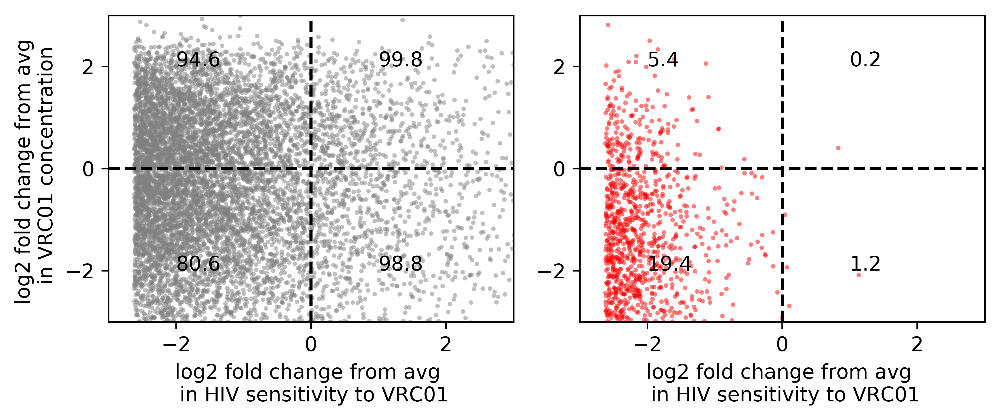

In [169]:
#do both variables

BT=outcomes[:,-1]

avgY2=50
avgIC50=2

varx=-np.log2(IC50_first/avgIC50) #log2 fold change in sensitivity from average
vary=np.log2(Y_first/avgY2) #log2 fold change in concentration at first positive from average concentration

NEt=0; NWt=0; SEt=0; SWt=0;
NEn=0; NWn=0; SEn=0; SWn=0;
NEp=0; NWp=0; SEp=0; SWp=0;
for i in range(len(vary)):
    #total num of sims in that regime (quadrant)
    if varx[i]>0 and vary[i]>0:
        NEt+=1
    if varx[i]>0 and vary[i]<0:
        SEt+=1
    if varx[i]<0 and vary[i]>0:
        NWt+=1
    if varx[i]<0 and vary[i]<0:
        SWt+=1

    #number of negative sims in that quadrant
    if varx[i]>0 and vary[i]>0 and BT[i]<1:
        NEn+=1
    if varx[i]>0 and vary[i]<0 and BT[i]<1:
        SEn+=1
    if varx[i]<0 and vary[i]>0 and BT[i]<1:
        NWn+=1
    if varx[i]<0 and vary[i]<0 and BT[i]<1:
        SWn+=1

    #number of positive sims in that quadrant
    if varx[i]>0 and vary[i]>0 and BT[i]>0:
        NEp+=1
    if varx[i]>0 and vary[i]<0 and BT[i]>0:
        SEp+=1
    if varx[i]<0 and vary[i]>0 and BT[i]>0:
        NWp+=1
    if varx[i]<0 and vary[i]<0 and BT[i]>0:
        SWp+=1


plt.figure(figsize=(7,3),dpi=rez)

plt.subplot(121)
plt.scatter(varx[BT<1],vary[BT<1],c='gray',s=5,alpha=0.5,lw=0)

plt.axhline(0,ls='--',color='k')
plt.axvline(0,ls='--',color='k')
plt.xlim([-3,3])
plt.ylim([-3,3])
plt.xticks([-2,0,2])
plt.yticks([-2,0,2])
plt.xlabel('log2 fold change from avg \n in HIV sensitivity to VRC01')
plt.ylabel('log2 fold change from avg \n in VRC01 concentration')

plt.annotate(str(round(100*NEn/NEt,1)),[1,2])
plt.annotate(str(round(100*NWn/NWt,1)),[-2,2])
plt.annotate(str(round(100*SEn/SEt,1)),[1,-2])
plt.annotate(str(round(100*SWn/SWt,1)),[-2,-2])

plt.subplot(122)
#plt.scatter(var1[BT<1],var2[BT<1],c='gray',s=5,alpha=0.5,lw=0)
plt.scatter(varx[BT>0],vary[BT>0],c='r',s=5,alpha=0.5,lw=0)

plt.axhline(0,ls='--',color='k')
plt.axvline(0,ls='--',color='k')

plt.xlabel('log2 fold change from avg \n in HIV sensitivity to VRC01')
#plt.ylabel('log2 fold change from avg \n in VRC01 concentration')
plt.xlim([-3,3])
plt.ylim([-3,3])
plt.xticks([-2,0,2])
plt.yticks([-2,0,2])

plt.annotate(str(round(100*NEp/NEt,1)),[1,2])
plt.annotate(str(round(100*NWp/NWt,1)),[-2,2])
plt.annotate(str(round(100*SEp/SEt,1)),[1,-2])
plt.annotate(str(round(100*SWp/SWt,1)),[-2,-2])


plt.tight_layout()
plt.savefig('figures/'+trial+'cyto.pdf')



MannwhitneyuResult(statistic=2228425.0, pvalue=0.0)
MannwhitneyuResult(statistic=39899.0, pvalue=2.1691684771967404e-113)


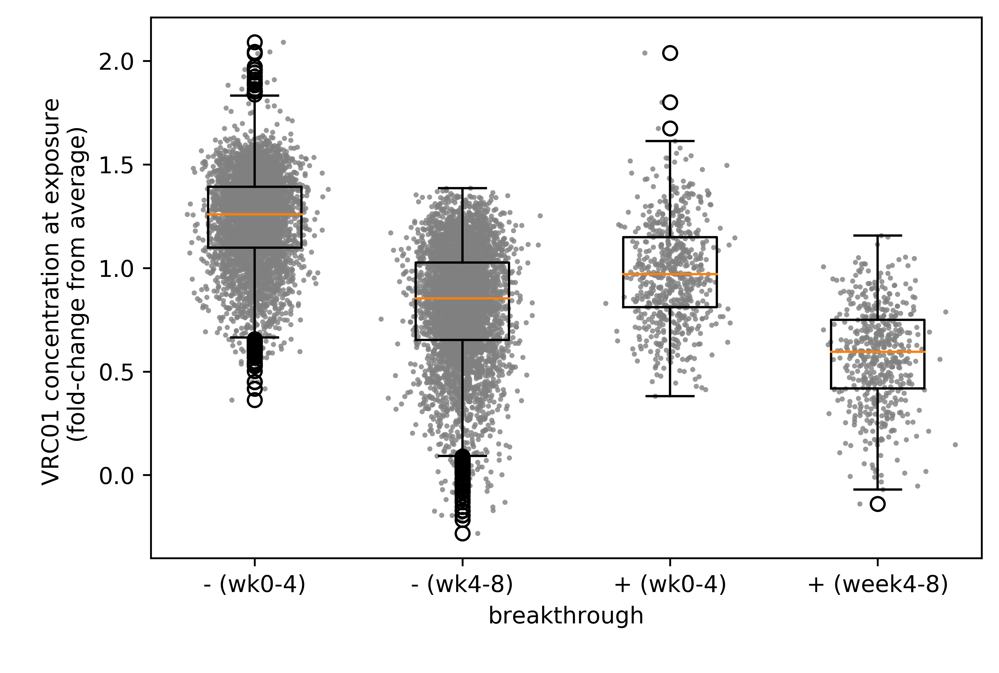

In [18]:
#just do breakthrough comparisons
plt.figure(figsize=(6,4),dpi=rez)

BT=outcomes[:,-1]
tc=var_vals_list[0,:]

#var=Y_first/np.mean(Y_first)
var=np.log10(Y_first)/np.mean(np.log10(Y_first))

conds=[[],[],[],[]] #negearly,neglate,posearly,poslate
for i in range(len(var)):

    if BT[i]<1 and tc[i]<28:
        conds[0].append(var[i])
    if BT[i]<1 and tc[i]>28:
        conds[1].append(var[i])
    if BT[i]>0 and tc[i]<28:
        conds[2].append(var[i])
    if BT[i]>0 and tc[i]>28:
        conds[3].append(var[i])
        
for i in range(len(conds)):
    plt.scatter(np.random.normal(i+1,0.1,len(conds[i])),conds[i],s=5,alpha=0.8,color='gray',lw=0)
    plt.annotate(str(len(conds[i])),[i+0.9,3.5])
    
plt.boxplot(conds)#,s=5,alpha=0.1,color=cz[j])

plt.xlabel('breakthrough',fontsize=10)
plt.xlim([0.5,4.5])
plt.xticks([1,2,3,4],['- (wk0-4)','- (wk4-8)','+ (wk0-4)','+ (week4-8)'])
plt.ylabel('VRC01 concentration at exposure \n (fold-change from average)')
plt.tight_layout()
plt.savefig('figures/'+trial+'sensitivity_YtvsBTvstc.pdf')

print(mannwhitneyu(conds[0],conds[1]))
print(mannwhitneyu(conds[2],conds[3]))


MannwhitneyuResult(statistic=9484186.0, pvalue=0.017872925989830733)
MannwhitneyuResult(statistic=164113.0, pvalue=0.13509832701274771)


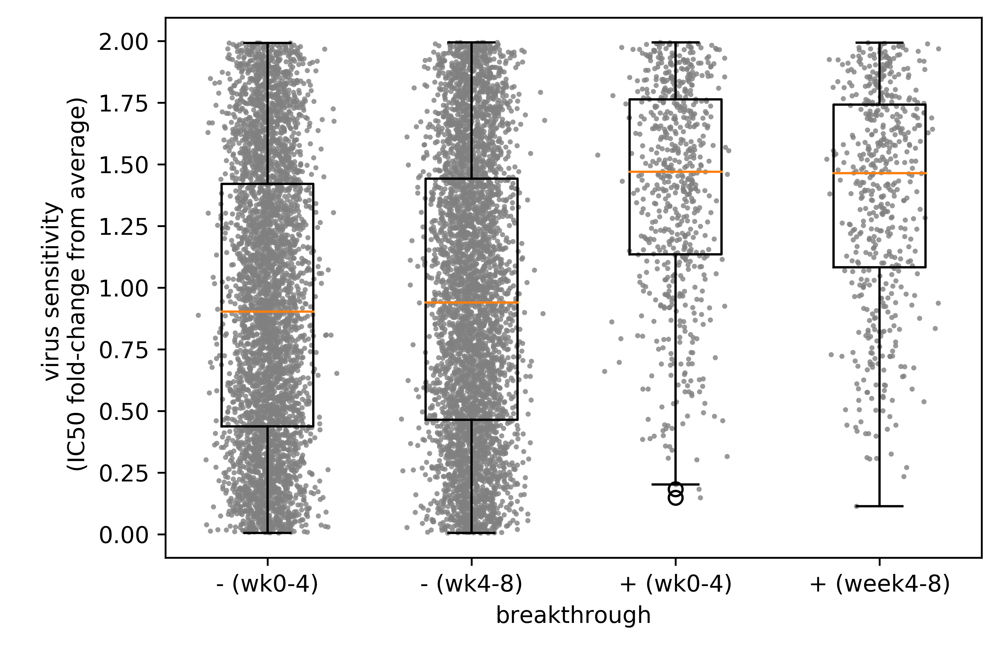

In [19]:
#just do breakthrough comparisons
plt.figure(figsize=(6,4),dpi=rez)

BT=outcomes[:,-1]
tc=var_vals_list[0,:]

var=IC50_first/np.mean(IC50_first)
#var=np.log10(IC50_first)

conds=[[],[],[],[]] #negearly,neglate,posearly,poslate
for i in range(len(var)):

    if BT[i]<1 and tc[i]<28:
        conds[0].append(var[i])
    if BT[i]<1 and tc[i]>28:
        conds[1].append(var[i])
    if BT[i]>0 and tc[i]<28:
        conds[2].append(var[i])
    if BT[i]>0 and tc[i]>28:
        conds[3].append(var[i])
        
for i in range(len(conds)):
    plt.scatter(np.random.normal(i+1,0.1,len(conds[i])),conds[i],s=5,alpha=0.8,color='gray',lw=0)
    plt.annotate(str(len(conds[i])),[i+0.9,13])
    
plt.boxplot(conds)#,s=5,alpha=0.1,color=cz[j])

plt.xlabel('breakthrough',fontsize=10)
plt.xlim([0.5,4.5])
plt.xticks([1,2,3,4],['- (wk0-4)','- (wk4-8)','+ (wk0-4)','+ (week4-8)'])
plt.ylabel('virus sensitivity \n (IC50 fold-change from average)')
#plt.ylabel('virus sensitivity, $\log_{10}IC_{50}$')
plt.tight_layout()
plt.savefig('figures/'+trial+'sensitivity_IC50vsBTvstc.pdf')

print(mannwhitneyu(conds[0],conds[1]))
print(mannwhitneyu(conds[2],conds[3]))


In [20]:
#prevention efficacy in each window
print(len(conds[1])/(len(conds[3])+len(conds[1])))
print(len(conds[0])/(len(conds[2])+len(conds[0])))


0.8946
0.8706


In [21]:
len(conds[2])+len(conds[0])

5000

In [22]:
#could do equivalent correlation stuff with "observed" on week 4 and week 8 visit



NameError: name 'w_case' is not defined

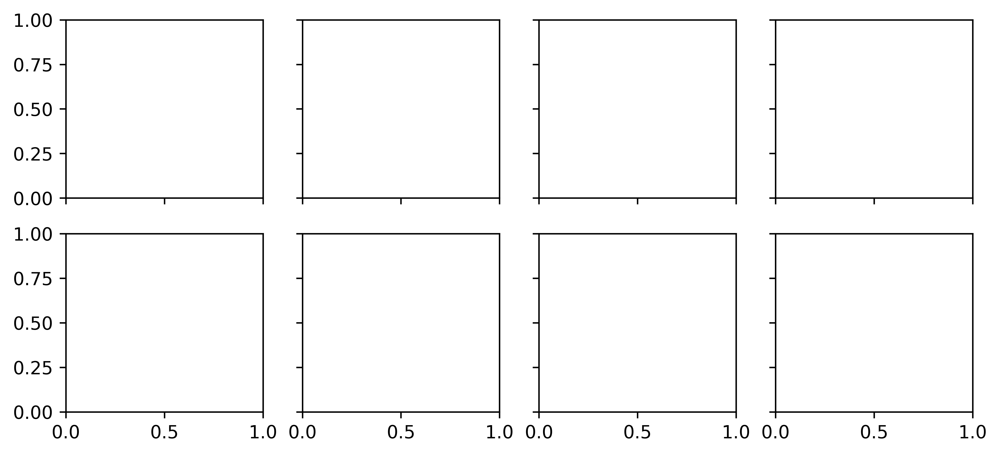

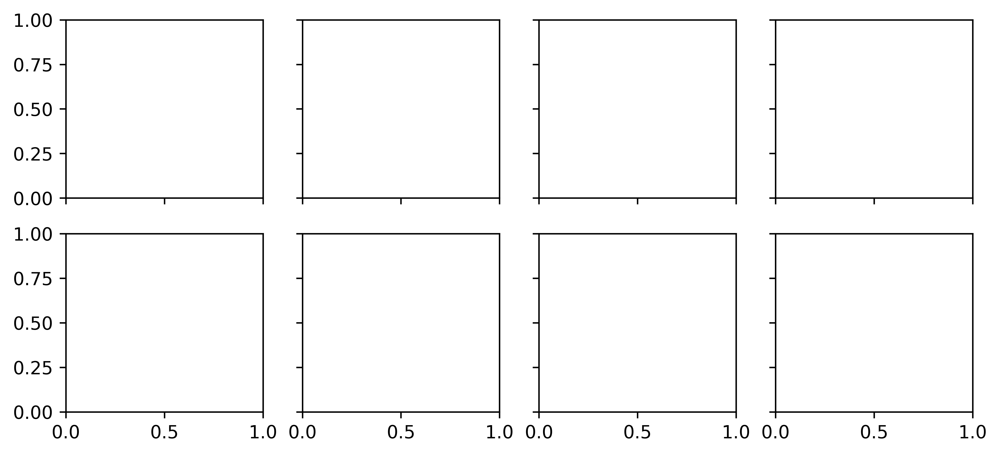

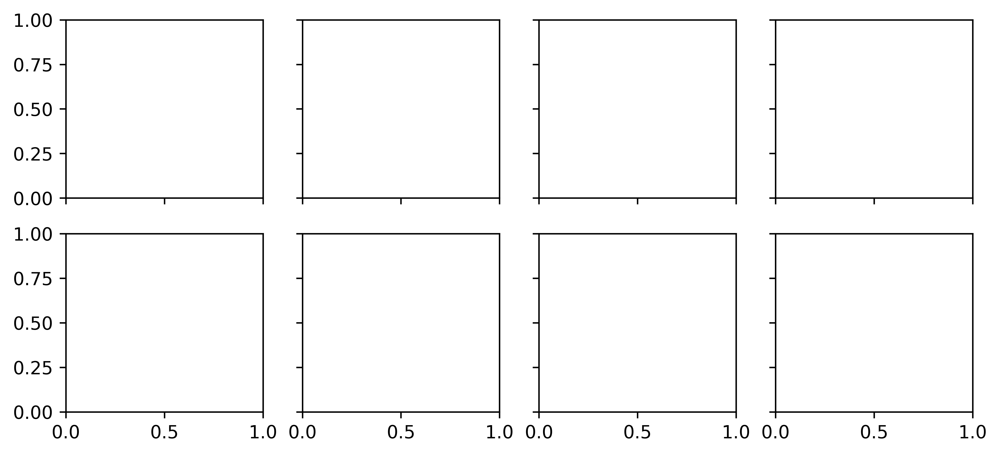

In [23]:
################################################################################
#local sensitivity analysis function

#need to make best/worst intelligently, see variables order
rangez=np.array([
        [0,40],     #tc
        [1e2,1e4],   #Y1
        [1e1,1e3],   #Y2
        [1e-2,1],   #k1
        [1e-3,1e-1],        #k2
        [0.5,1.5],      #h
        []])   #IC50

                                    
tY=np.linspace(0,7*16,1e4) #time for antibody dose 16 week time series in days, allow worst case no AB at last interval

fig1,axarr1 = plt.subplots(2,4,sharex=True,sharey=True,figsize=(9,4),dpi=rez)
fig2,axarr2 = plt.subplots(2,4,sharex=True,sharey=True,figsize=(9,4),dpi=rez)
fig3,axarr3 = plt.subplots(2,4,sharex=True,sharey=True,figsize=(9,4),dpi=rez)
#looping over the number of variables to check sensitivity

num_ppts=25
for k in range(num_ppts): 
    aSr,dSr,Bt0r,taur,lamr,dAr,thLr,xir,kr,aEr,dEr,E50r,wr,pr,gr=goodP_list[k] #choose a random model primary infection
    for i in range(len(variables)):
        ax=axarr1[i%2][int(i/2.)]
        axL=axarr2[i%2][int(i/2.)]
        axE=axarr3[i%2][int(i/2.)]
        
        #set both at median vals and change the i-th parameter
        lo=np.median(all_vals,1); lo[i]=w_case[i];
        hi=np.median(all_vals,1); hi[i]=b_case[i];
        
        #evaluate model twice
        tc,Y1,Y2,k1,k2,h,IC50=lo #choose low range of params
        
        in_tc=np.where(tY>tc)[0][0] #index of first contact
        tV=tY[in_tc:] #time for virus
        
        sol,vll,infpoz,t_fp,t_max=run_model(
            tV,X0,aSr,dSr,Bt0r,taur,lamr,dAr,thLr,xir,kr,aEr,dEr,E50r,wr,pr,gr,Y1,Y2,k1,k2,h,IC50)

        ax.plot(tV/7,vll,alpha=0.7,color='darkred')
        
        axL.plot(tV/7,sol[:,3],color='darkred',ls='--')
        axL.plot(tV/7,sol[:,4],color='darkred')
        
        axE.plot(tV/7,sol[:,5],color='darkred')

        tc,Y1,Y2,k1,k2,h,IC50=hi #choose high range of params
        in_tc=np.where(tY>tc)[0][0] #index of first contact
        tV=tY[in_tc:] #time for virus
        sol,vll,infpoz,t_fp,t_max=run_model(
            tV,X0,aSr,dSr,Bt0r,taur,lamr,dAr,thLr,xir,kr,aEr,dEr,E50r,wr,pr,gr,Y1,Y2,k1,k2,h,IC50)

        ax.plot(tV/7,vll,alpha=0.7,color='deepskyblue')

        axL.plot(tV/7,sol[:,3]*1e6/vol,color='deepskyblue',ls='--')
        axL.plot(tV/7,sol[:,4]*1e6/vol,color='deepskyblue')
        
        axE.plot(tV/7,sol[:,5],color='deepskyblue')

        #ax.fill_between(lot/7,lo_sol[:,6]/vol*1e3,hi_sol[:,6]/vol*1e3,alpha=0.6)

        #ax.set_ylim([0.1,100])
        ax.set_title(variables[i],fontsize=10)# + str(rangez[i][0]) + r'$\to$' +str(rangez[i][1]),fontsize=10)
        axL.set_title(variables[i],fontsize=10)# + str(rangez[i][0]) + r'$\to$' +str(rangez[i][1]),fontsize=10)
        axE.set_title(variables[i],fontsize=10)# + str(rangez[i][0]) + r'$\to$' +str(rangez[i][1]),fontsize=10)
        ax.axhline(2,color='k',ls='--')

#ax.set_xticks(np.linspace(0,8,9))
#ax.set_yticks(np.linspace(-4,8,13))
ax.set_ylim([-6,8])
axL.set_ylim([0,100])
axE.set_ylim([0,100])

axarr1[0][0].set_ylabel('VL $\log_{10}$(copies/mL)',fontsize=10)
axarr1[1][0].set_ylabel('VL $\log_{10}$(copies/mL)',fontsize=10)
axarr1[1][3].axis('off')

axarr2[0][0].set_ylabel('latent (cells)',fontsize=10)
axarr2[1][0].set_ylabel('latent (cells)',fontsize=10)
axarr2[1][3].axis('off')

axarr3[0][0].set_ylabel('adaptive (cells/$\mu$L)',fontsize=10)
axarr3[1][0].set_ylabel('adaptive (cells/$\mu$L)',fontsize=10)
axarr3[1][3].axis('off')

for i in range(4):
    axarr1[1][i].set_xlabel('time (weeks)')
    axarr2[1][i].set_xlabel('time (weeks)')
    axarr3[1][i].set_xlabel('time (weeks)')

fig1.tight_layout()
fig2.tight_layout()
fig3.tight_layout()
fig1.savefig('figures/sensitivity_local_V.pdf')
fig2.savefig('figures/sensitivity_local_L.pdf')
fig3.savefig('figures/sensitivity_local_E.pdf')


In [ ]:
################################################################################
#simulate a trial

sampz=10**4 #number of LHS samples

lhs_samples = pyDOE.lhs( int(len(variables)), samples=sampz, criterion='center') #create the samples in [0,1]

tt=np.linspace(0,56,1e4) #8 week time series in days

var_vals=np.zeros(len(variables)); var_vals_list=np.zeros([len(variables),sampz])

outcome_list=[]; good_sets=[]

if sampz<50:
    fig, ax = plt.subplots(1,2,figsize=(4,3),dpi=rez,sharex=True)

rangez=np.zeros([len(variables),2])
for i in range(len(variables)):
    rangez[i,:]=all_vals[i].min(),all_vals[i].max() #arrange small to big
    
#rangez=np.array([[0,30],[0,600],[0,300],[0,0.3],[0,0.7],[0.8,5],[0.2,20]]) #variable ranges

ppt_list=[]
#looping over the number of LHS samples
for i in range(sampz):

    #I3_0    = 10**(np.log10(rangez[0][0]) + lhs_samples[i][0]*(np.log10(rangez[0][1])-np.log10(rangez[0][0])))

    #make the variable values using the LHS sampling
    var_vals = rangez[:,0]+lhs_samples[i,:]*(rangez[:,1]-rangez[:,0])
    
    var_vals_list[:,i]=var_vals #append to all the variables
    
    rand_ppt=np.random.randint(0,len(goodP_list)) #choose a random participant ID
    
    ppt_list.append(rand_ppt)
    
    aSr,dSr,Bt0r,taur,lamr,dAr,thLr,xir,kr,aEr,dEr,E50r,wr,pr,gr=goodP_list[rand_ppt] #choose a random model
    tc,Y1,Y2,k1,k2,h,IC50=var_vals #choose LHS range of params

    in_tc=np.where(tY>tc)[0][0] #index of first contact
    tV=tY[in_tc:] #time for virus
    sol,vll,infpoz,time_first_pos,t_max=run_model(
        tV,X0_det,aSr,dSr,Bt0r,taur,lamr,dAr,thLr,xir,kr,aEr,dEr,E50r,wr,pr,gr,Y1,Y2,k1,k2,h,IC50)

    #calculate outcomes
    dt=tY[1]
    time_to_peak=t_max-tV[0]; #time_to_peak=time_to_peak[time_to_peak>0] #days make sure this only counts good ones
    
    max_VL=np.min([10,np.nanmax(vll)]) #copies/mL, ignore weird artificially high ones
    AUC_VL=np.nansum(vll*dt) #copies/mL
    AUC_E=sol[-1,5] #cells/uL, final number, sort of total recruited
    Ltot=(sol[-1,3]+sol[-1,4])/sol[-1,0]*1e6 #IUPM at end of 8 weeks
    
    outcome_list.append([time_first_pos, time_to_peak, max_VL, AUC_VL, AUC_E, Ltot])
        
    if sampz<50:
        #make plots showing variation              
        ax[0].plot(tV/7,vll,alpha=0.3)

        Y_t,I_t = Ab_model(tt,Y1,Y2,k1,k2,h,IC50)    #refreshes every 8 weeks
        ax[1].plot(tt/7, R0*(1-I_t),alpha=0.3)

if sampz<50:
    ax[0].set_ylim([-8,8])
    ax[0].set_ylabel('VL $\log_{10}$(copies/mL)')
    ax[0].set_xlabel('time (weeks)')
    ax[0].axhline(np.log10(30),color='k')
    ax[0].annotate('detect lim',xy=[1,2],fontsize=8)
    ax[1].set_ylabel('$\mathcal{R}(Ab,t)$')
    ax[1].set_xlabel('time (weeks)')
    #ax[0].set_xticks(np.linspace(0,8,9))
    ax[1].axhline(1,color='k',ls='--')
    #plt.ylim([-5,10])
    plt.tight_layout()
    #plt.legend(range(sampz),fontsize=6)
    plt.savefig('figures/global_sensistivity_examples.pdf')
    